# Import Data


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.linear_model import LogisticRegression


In [2]:
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import make_column_selector as selector
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split



In [149]:
df=pd.read_csv("C:/Users/nithi/Desktop/Hackathon/train_loan_data.csv")
#lets import the csv file

In [ ]:
df.head()

In [5]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
annual_inc,80000.0,76046.143138,69020.055377,0.00,46000.00,65000.00,90000.00,7141778.00
fico_range_high,80000.0,699.987975,31.734840,664.00,674.00,694.00,714.00,850.00
fico_range_low,80000.0,695.987813,31.734075,660.00,670.00,690.00,710.00,845.00
int_rate,80000.0,13.232898,4.771705,5.31,9.75,12.74,15.99,30.99
loan_amnt,80000.0,14403.867813,8703.826298,750.00,7925.00,12000.00,20000.00,40000.00
num_actv_bc_tl,76052.0,3.633790,2.262505,0.00,2.00,3.00,5.00,32.00
mort_acc,77229.0,1.674759,2.005104,0.00,0.00,1.00,3.00,32.00
tot_cur_bal,76052.0,141586.358991,159371.366632,0.00,29642.00,81000.50,211027.25,5172185.00
open_acc,80000.0,11.605675,5.483362,1.00,8.00,11.00,14.00,80.00
pub_rec,80000.0,0.216675,0.579854,0.00,0.00,0.00,0.00,24.00


In [ ]:
df.info()

In [ ]:
df['emp_title'].unique()

In [4]:
for x in df.columns:
    print(f"unique terms in {x}",df[x].nunique())

unique terms in addr_state 51
unique terms in annual_inc 7536
unique terms in earliest_cr_line 640
unique terms in emp_length 11
unique terms in emp_title 36661
unique terms in fico_range_high 38
unique terms in fico_range_low 38
unique terms in grade 7
unique terms in home_ownership 6
unique terms in application_type 2
unique terms in initial_list_status 2
unique terms in int_rate 549
unique terms in loan_amnt 1373
unique terms in num_actv_bc_tl 28
unique terms in mort_acc 28
unique terms in tot_cur_bal 65410
unique terms in open_acc 56
unique terms in pub_rec 15
unique terms in pub_rec_bankruptcies 8
unique terms in purpose 14
unique terms in revol_bal 32971
unique terms in revol_util 1080
unique terms in sub_grade 35
unique terms in term 2
unique terms in title 5348
unique terms in total_acc 107
unique terms in verification_status 3
unique terms in loan_status 2


In [ ]:
# 1) unique terms in emp_title is too high either reduce dimensionality or remove column completely

# Handling missing data

In [150]:
df.drop(columns=['earliest_cr_line'],inplace=True)
# because when the earliest credit line opened doesnt matter 

In [151]:
missing_values = pd.DataFrame(round(df.isnull().sum()/len(df.index)*100,2),columns=['missing_values_percent'])

#sns.barplot(x='index',y='null_percent',data=nulls.reset_index())
missing_values[missing_values['missing_values_percent']!=0.00].sort_values('missing_values_percent',ascending=False)

,missing_values_percent
emp_title,6.27
emp_length,5.74
num_actv_bc_tl,4.93
tot_cur_bal,4.93
mort_acc,3.46
title,1.21
revol_util,0.07
pub_rec_bankruptcies,0.04


In [ ]:
df['emp_length'].value_counts()

In [152]:
df['emp_length'].fillna('Unknown', inplace=True)

In [ ]:

df['num_actv_bc_tl'].value_counts()

In [153]:

mean_num_actv_bc_tl =df['num_actv_bc_tl'].mean()
df['num_actv_bc_tl'].fillna(mean_num_actv_bc_tl, inplace=True)

In [ ]:

df['mort_acc'].value_counts()

In [154]:
mean_mort_acc=df['mort_acc'].mean()
df['mort_acc'].fillna(mean_mort_acc, inplace=True)

In [ ]:
df['tot_cur_bal'].value_counts()

In [155]:
mode_tot_cur_bal=df['tot_cur_bal'].mode()[0]
df['tot_cur_bal'].fillna(mode_tot_cur_bal, inplace=True)

In [ ]:
df['emp_title'].value_counts()

In [156]:
df['emp_title'].fillna('Unknown', inplace=True)

In [157]:
df.dropna(inplace=True)
#since these missing values are less than 5% i would rather drop those rows than modify them

In [158]:
missing_values = pd.DataFrame(round(df.isnull().sum()/len(df.index)*100,2),columns=['missing_values_percent'])
#sns.barplot(x='index',y='null_percent',data=nulls.reset_index())
missing_values[missing_values['missing_values_percent']!=0.00].sort_values('missing_values_percent',ascending=False)

,missing_values_percent


# Univarate analysis

In [14]:
def cat_num_split(df):
    cat_cols=df.select_dtypes(include=['object']).columns
    num_cols = df.select_dtypes(include=np.number).columns.tolist()
    return cat_cols,num_cols

In [105]:
cat_cols,num_cols=cat_num_split(df)

In [16]:
cat_cols

Index(['addr_state', 'earliest_cr_line', 'emp_length', 'emp_title', 'grade',
       'home_ownership', 'application_type', 'initial_list_status', 'purpose',
       'sub_grade', 'term', 'title', 'verification_status', 'loan_status'],
      dtype='object')

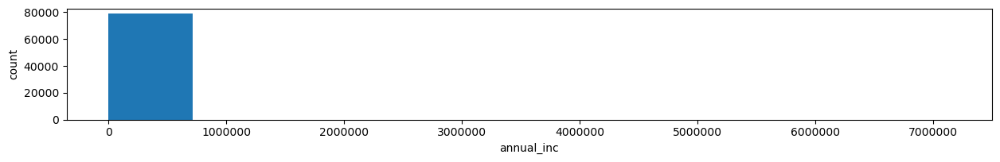

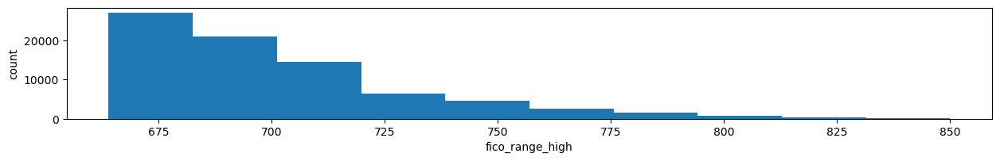

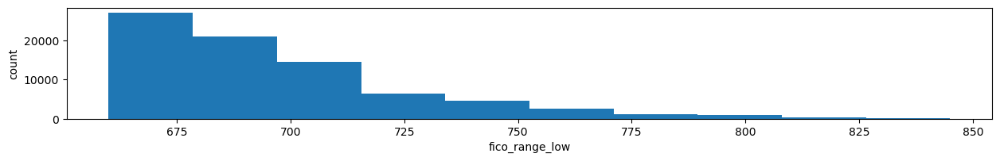

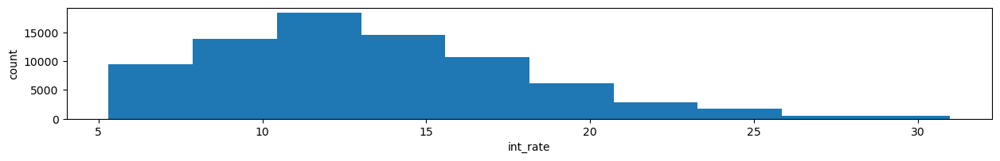

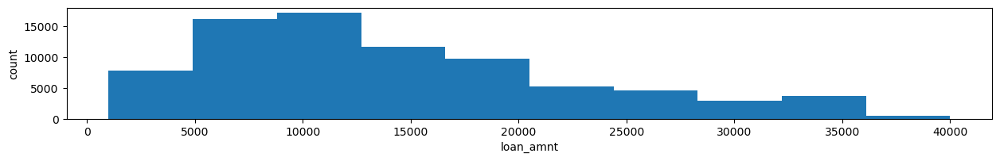

...

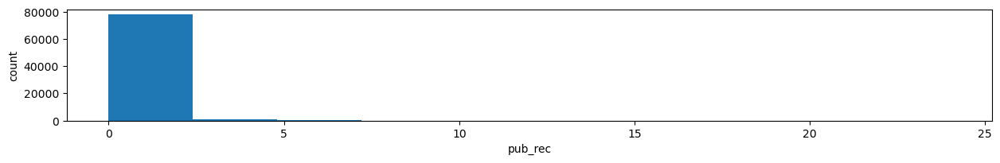

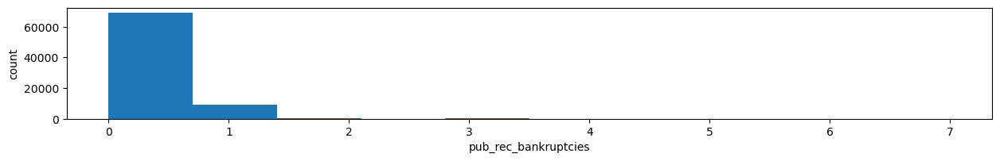

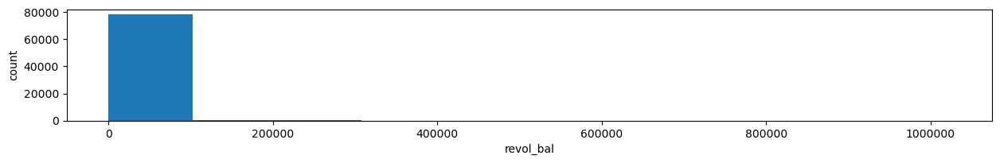

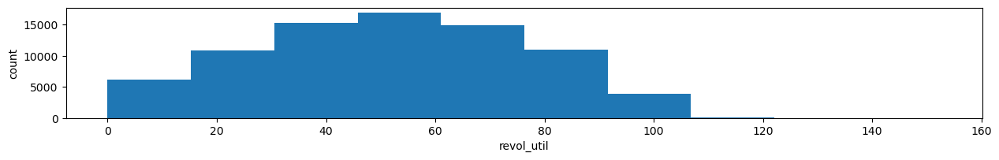

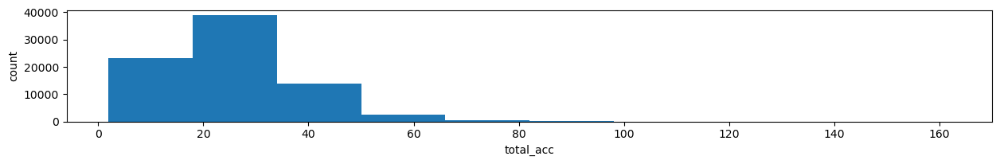

In [17]:
for col in num_cols:
    
    plt.figure(figsize = (15, 4))
    plt.subplot(2, 1,1)
    
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.ticklabel_format(style="plain")
    plt.xlabel(col)


# Multivariate Analysis

annual_inc


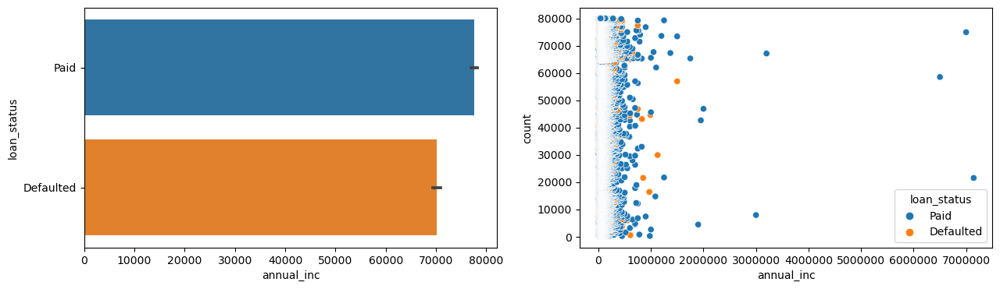

fico_range_high


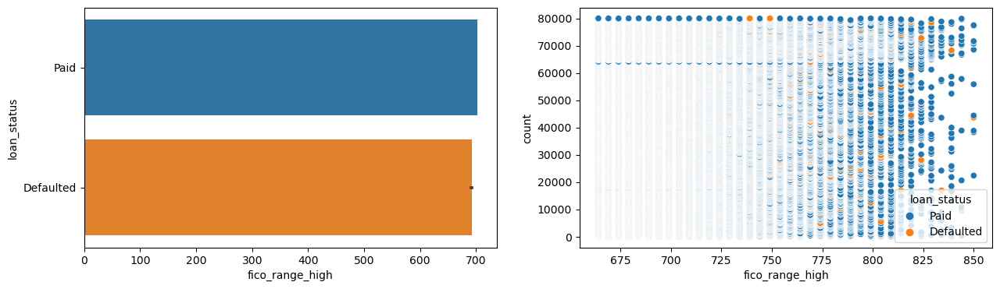

fico_range_low


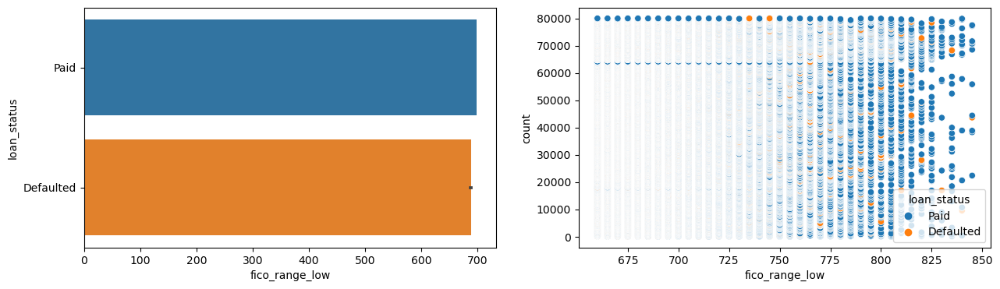

int_rate


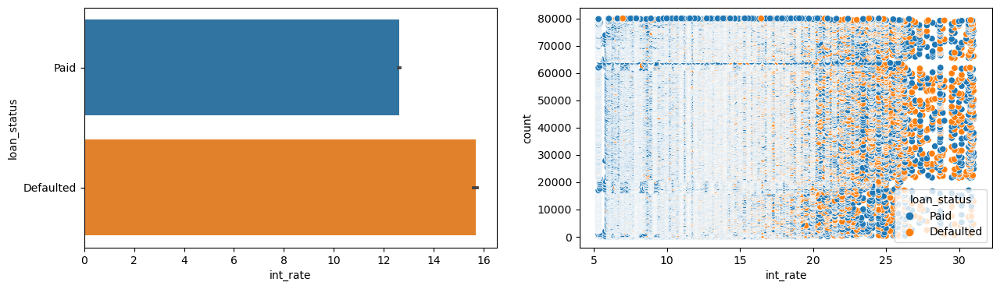

loan_amnt


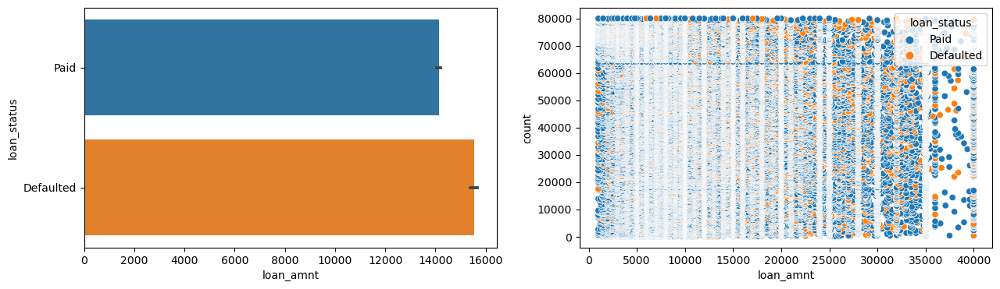

num_actv_bc_tl


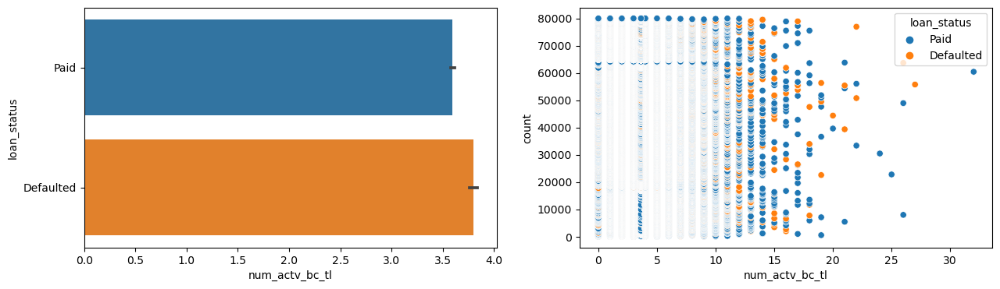

mort_acc


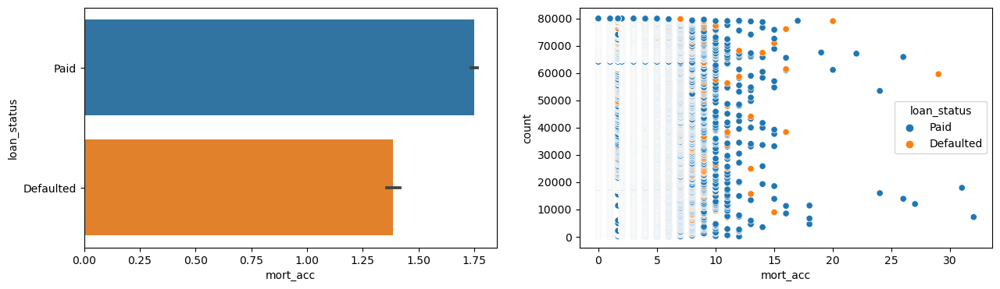

tot_cur_bal


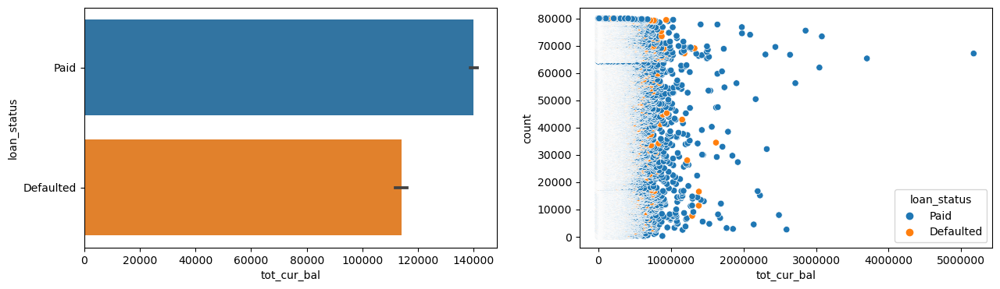

open_acc


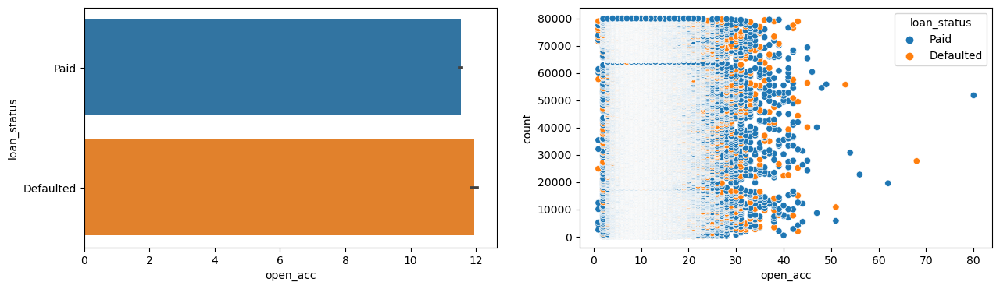

pub_rec


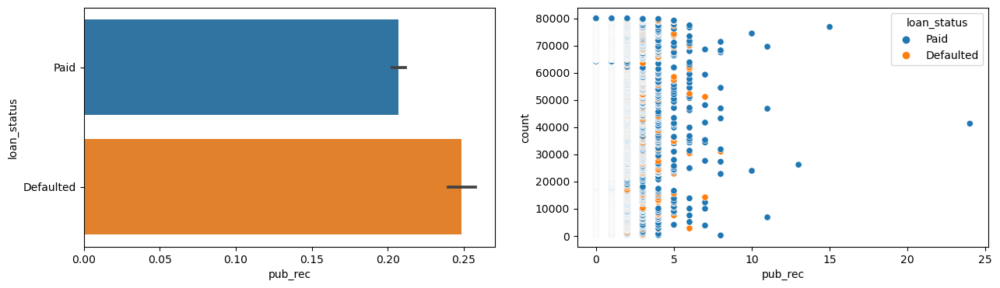

pub_rec_bankruptcies


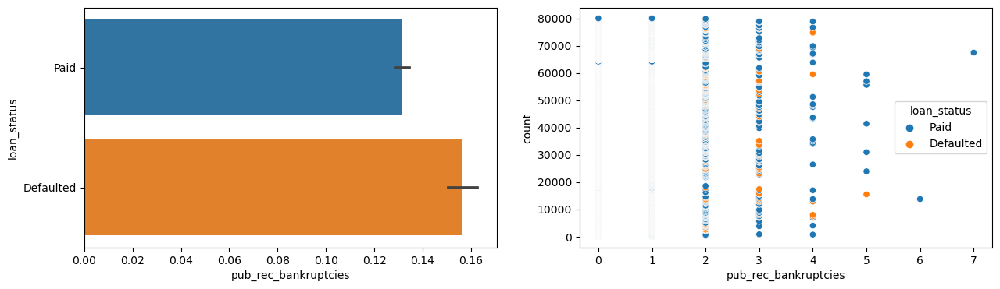

revol_bal


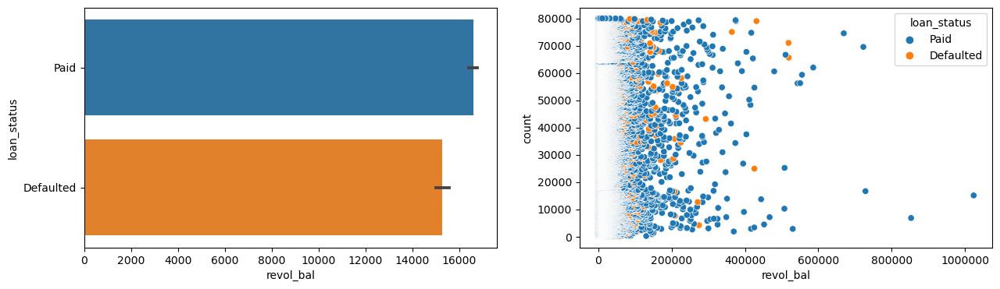

revol_util


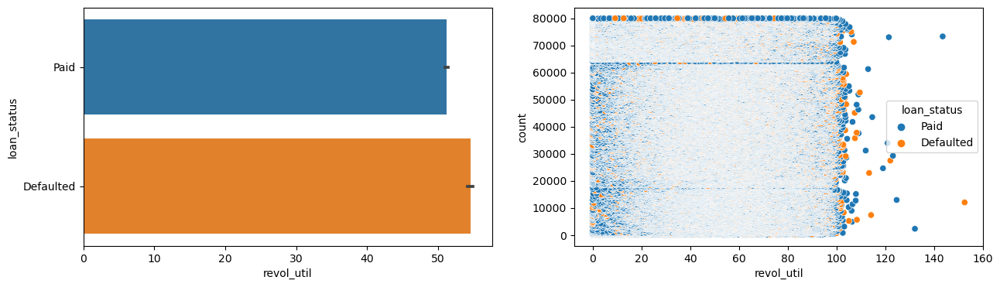

total_acc


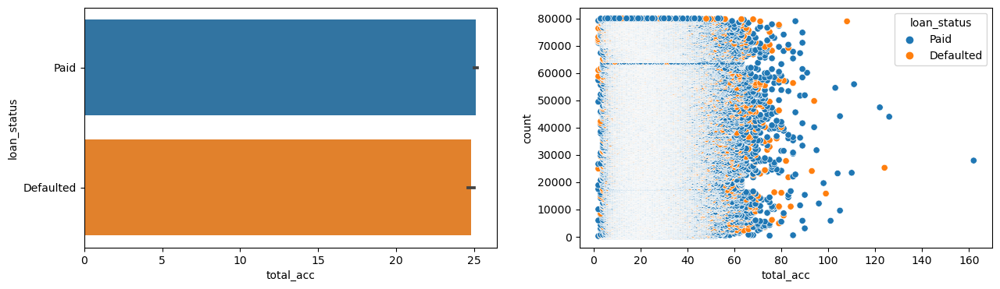

In [18]:
for col in num_cols:
    print(col)
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    sns.barplot(x=df[col], 
                y=df['loan_status']) 
    plt.ylabel('loan_status')
    plt.ticklabel_format(style="plain",axis='x')
    plt.xlabel(col)
    plt.subplot(1, 2, 2)
    sns.scatterplot(y=df.index,x=df[col],hue=df['loan_status'])
    plt.ticklabel_format(style='plain', axis='x')
    plt.xlabel(col)
    
    plt.ylabel('count')
    plt.show()
    


In [ ]:
# information from above plots
# 1) dataset has majority data of people who earn less than 20K i will not consider the few data points in the minority as outliers
# 2)people with revol_bal <30000 have taken more loans
# 

In [19]:
cat_cols

Index(['addr_state', 'earliest_cr_line', 'emp_length', 'emp_title', 'grade',
       'home_ownership', 'application_type', 'initial_list_status', 'purpose',
       'sub_grade', 'term', 'title', 'verification_status', 'loan_status'],
      dtype='object')

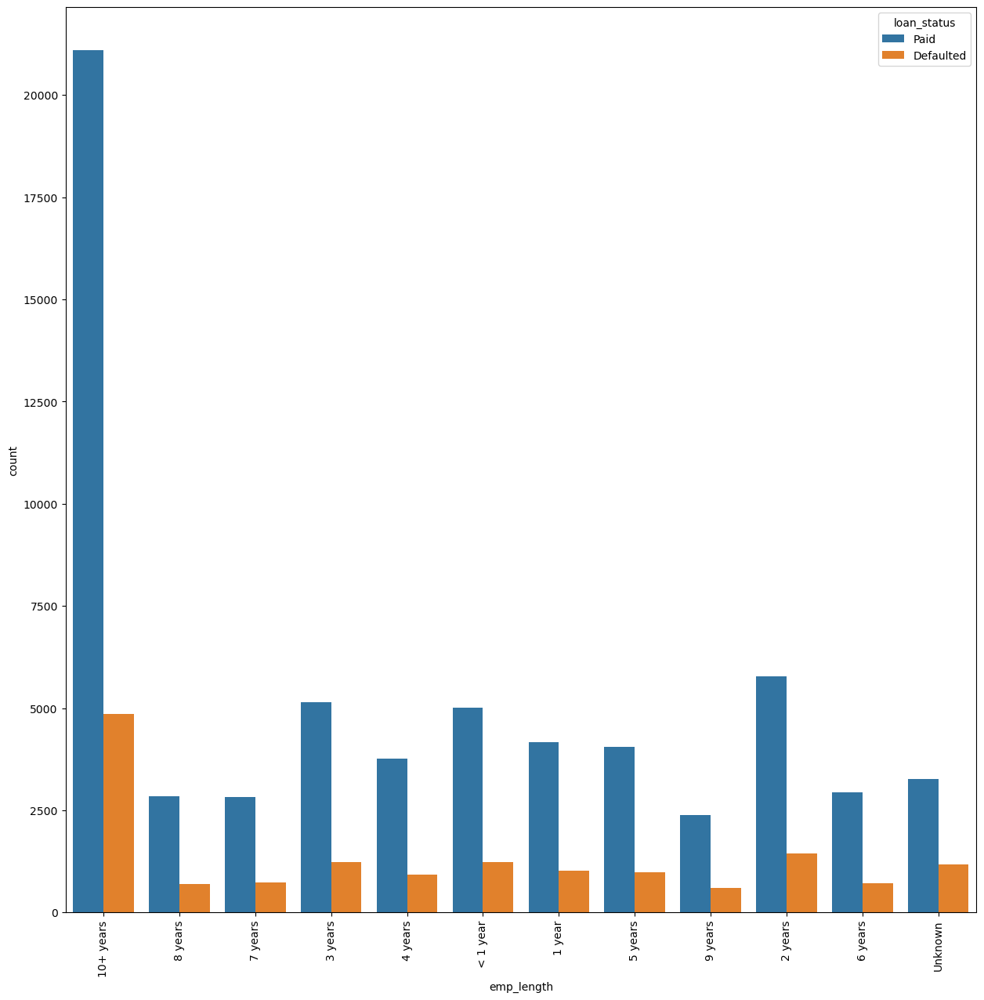

In [20]:
plt.figure(figsize=(15,15))
sns.countplot(x=df['emp_length'],hue='loan_status',data=df) 

plt.xticks(rotation=90)
plt.show()

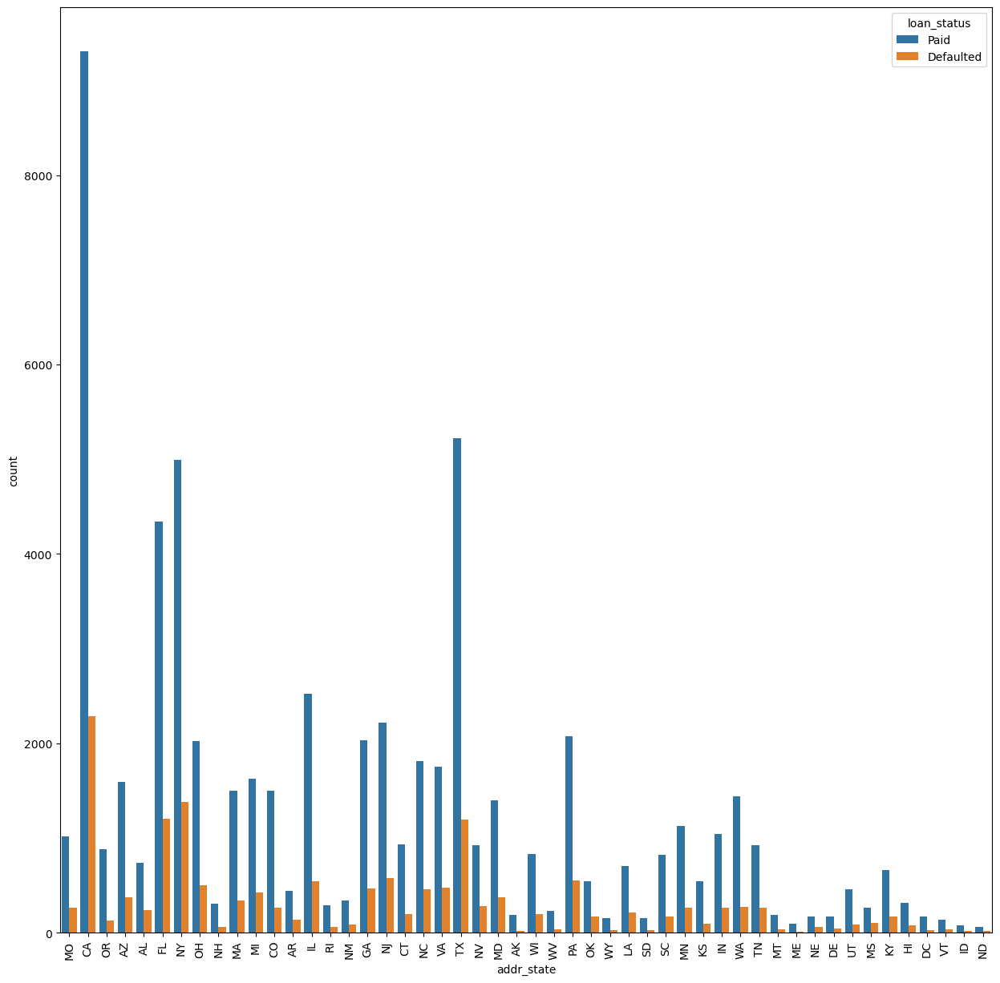

In [21]:
plt.figure(figsize=(15,15))
sns.countplot(x=df['addr_state'],hue='loan_status',data=df) 

plt.xticks(rotation=90)
plt.show()

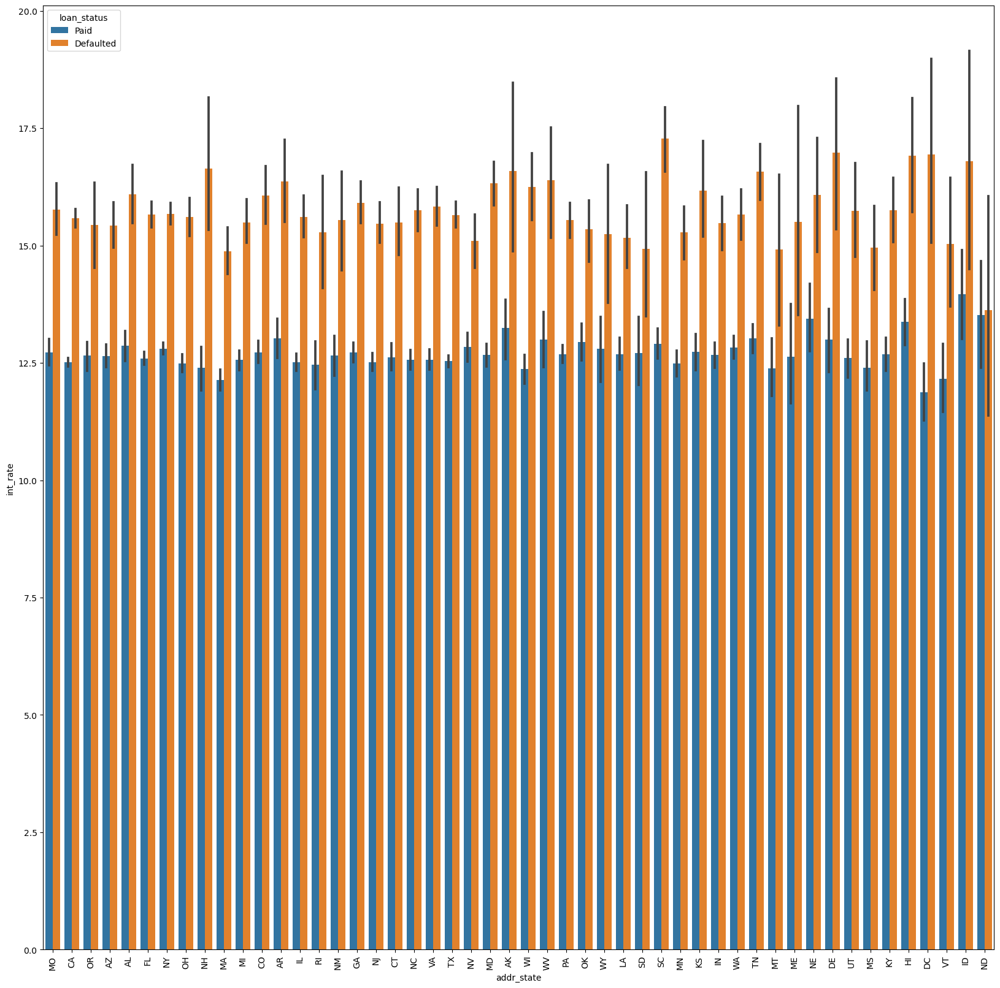

In [22]:
plt.figure(figsize=(20,20))
sns.barplot(x=df['addr_state'],y=df['int_rate'],hue='loan_status',data=df) 

plt.xticks(rotation=90)
plt.show()

In [43]:
cat_cols

Index(['addr_state', 'earliest_cr_line', 'emp_length', 'emp_title', 'grade',
       'home_ownership', 'application_type', 'initial_list_status', 'purpose',
       'sub_grade', 'term', 'title', 'verification_status', 'loan_status'],
      dtype='object')

<Axes: xlabel='grade', ylabel='loan_amnt'>

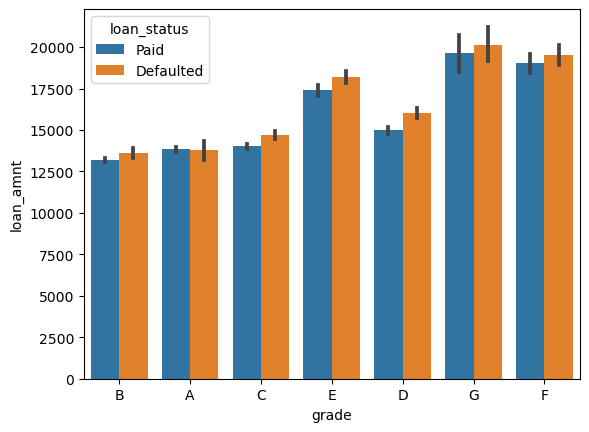

In [23]:
sns.barplot(y=df['loan_amnt'],x=df['grade'],hue=df['loan_status'])

<Axes: xlabel='int_rate', ylabel='Density'>

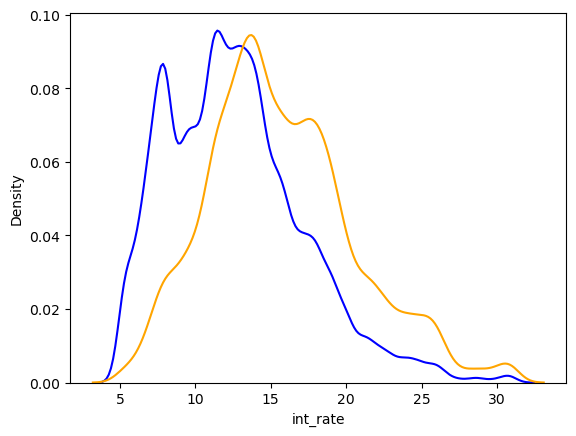

In [24]:
sns.kdeplot(df[df['loan_status'] == "Paid"]['int_rate'],  color='blue') 
sns.kdeplot(df[df['loan_status'] == "Defaulted"]['int_rate'],  color="orange")

In [ ]:
#this graph shows us that loans with interest rates greater than ~12% tend to be defaulted more

C:\Users\nithi\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1300x1700 with 0 Axes>

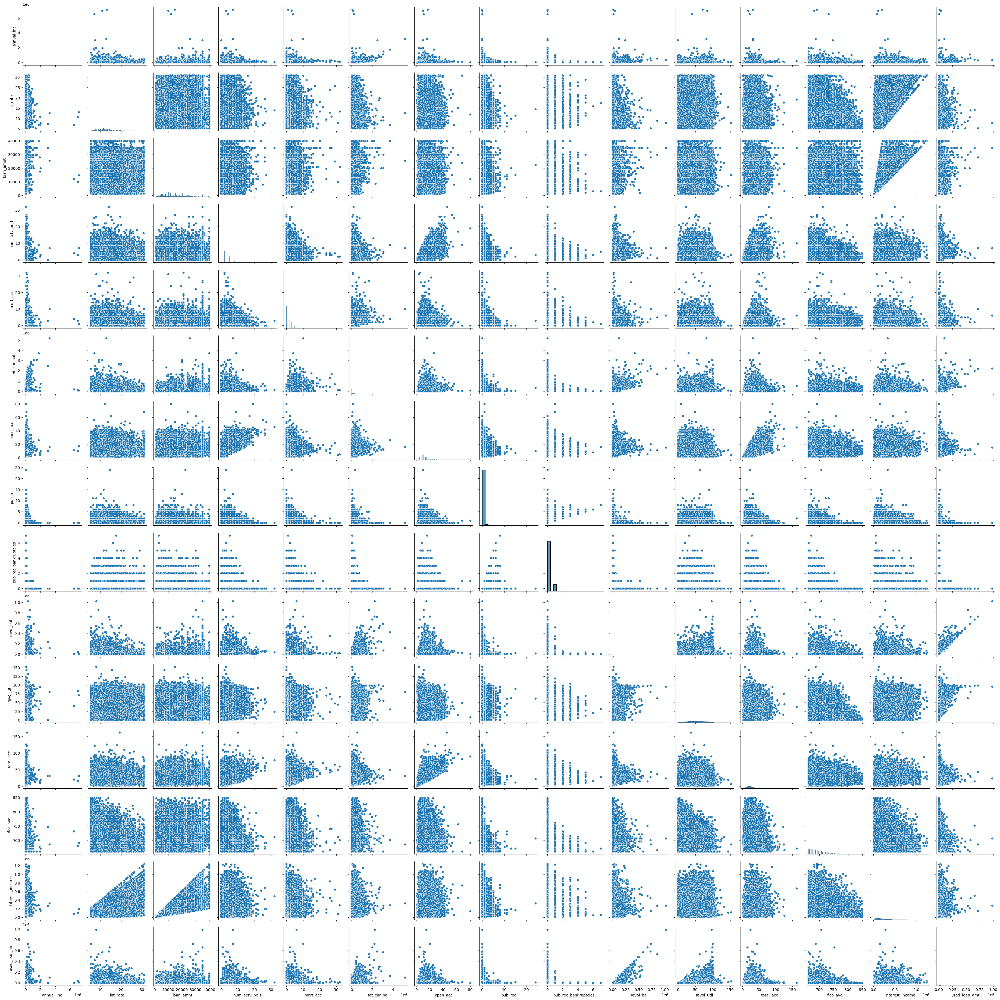

In [115]:
plt.figure(figsize=(13,17))
sns.pairplot(data=df)
plt.show()

In [ ]:
#total_acc and open acc,num_actv_bc_tl,mort_acc,tot_cur_bal are all positively correlated 
#revol_util is negatively correlated with fico
#annual_inc,num_actv_bc_tl , mort_acc,tot_curr_bal,open_acc,pu_rec,revol_bal,revol_util,total_acc are all left skewed

<Axes: xlabel='fico_avg', ylabel='Density'>

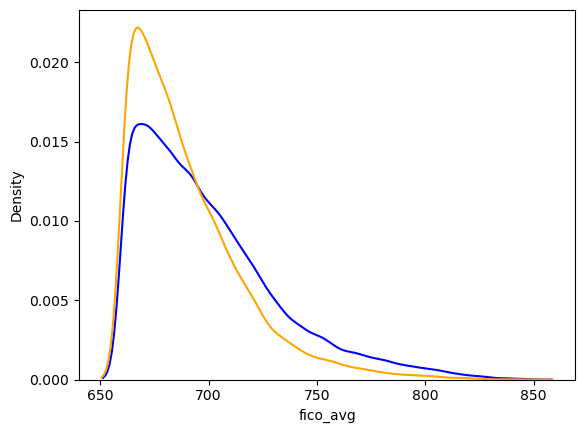

In [39]:
sns.kdeplot(df[df['loan_status'] == "Paid"]['fico_avg'],  color='blue') 
sns.kdeplot(df[df['loan_status'] == "Defaulted"]['fico_avg'],  color="orange")

In [65]:
cat_cols

Index(['addr_state', 'earliest_cr_line', 'emp_length', 'emp_title', 'grade',
       'home_ownership', 'application_type', 'initial_list_status', 'purpose',
       'sub_grade', 'term', 'title', 'verification_status', 'loan_status'],
      dtype='object')

<Axes: xlabel='grade', ylabel='num_actv_bc_tl'>

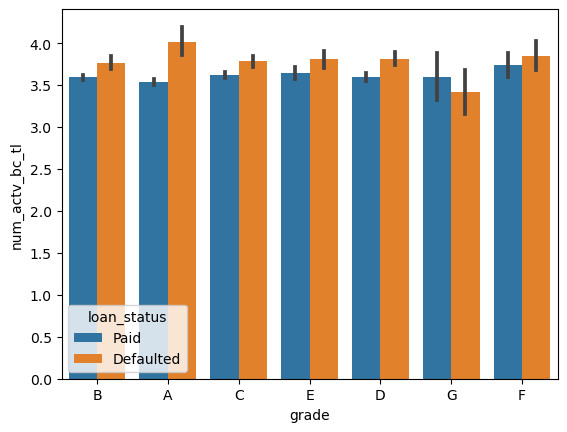

In [29]:
sns.barplot(x=df['grade'],y=df['num_actv_bc_tl'],hue=df['loan_status'])

<Axes: xlabel='grade', ylabel='num_actv_bc_tl'>

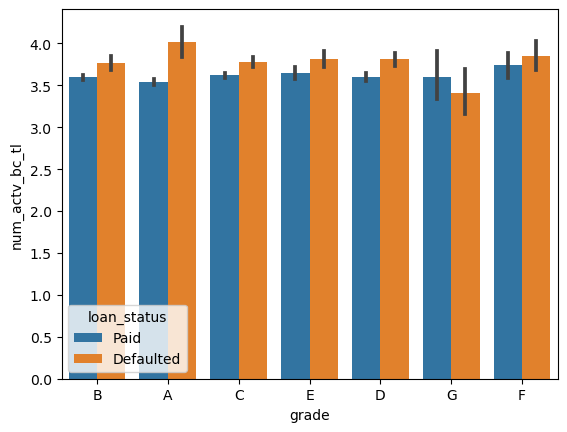

In [30]:
sns.barplot(x=df['grade'],y=df['num_actv_bc_tl'],hue=df['loan_status'])

In [41]:
pd.crosstab(df['grade'], df['addr_state'])



addr_state,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,GA,HI,ID,IL,IN,KS,KY,LA,MA,MD,ME,MI,MN,MO,MS,MT,NC,ND,NE,NH,NJ,NM,NV,NY,OH,OK,OR,PA,RI,SC,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
grade,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A,29,160,81,367,2039,334,206,49,35,931,428,49,7,593,208,112,142,161,421,312,19,358,271,213,56,47,376,11,26,65,532,61,194,1044,434,101,201,444,70,161,34,181,1191,95,387,30,310,208,36,32
B,63,247,161,576,3532,507,339,57,61,1654,737,115,31,922,377,185,229,280,535,483,34,600,399,364,107,75,685,24,64,116,828,146,359,1850,779,218,295,726,97,271,56,281,1920,164,650,69,474,298,85,58
C,60,287,174,535,3276,488,300,47,52,1553,692,110,34,822,396,198,245,221,479,508,27,599,400,386,113,59,655,23,73,100,740,120,354,1803,714,209,265,808,106,282,59,366,1754,163,636,45,505,269,61,50
D,44,163,93,296,1671,255,176,30,40,863,353,70,19,424,197,77,144,153,244,272,19,307,203,190,53,24,331,14,41,50,412,65,179,998,362,100,165,414,51,149,25,206,934,73,322,24,255,143,55,27
E,10,86,51,132,754,127,72,13,19,389,199,39,10,190,98,46,52,76,118,136,7,138,91,95,31,14,156,8,25,26,202,27,83,451,180,68,58,174,17,92,6,105,430,35,162,7,125,75,25,15
F,6,30,18,46,264,44,29,2,8,124,72,11,1,85,25,16,16,18,40,52,2,41,20,26,4,6,53,1,7,8,68,12,28,175,43,18,18,54,10,32,2,32,133,12,58,6,31,30,5,2
G,1,6,4,17,57,15,9,0,1,33,17,5,0,28,8,4,2,7,6,14,1,12,12,9,2,1,13,0,0,4,15,2,10,49,19,3,10,12,0,6,4,14,52,4,15,0,15,8,0,1


In [ ]:
# we can arrange Grade A in Descending order which would give us cities with higher human capital


<Axes: xlabel='grade', ylabel='annual_inc'>

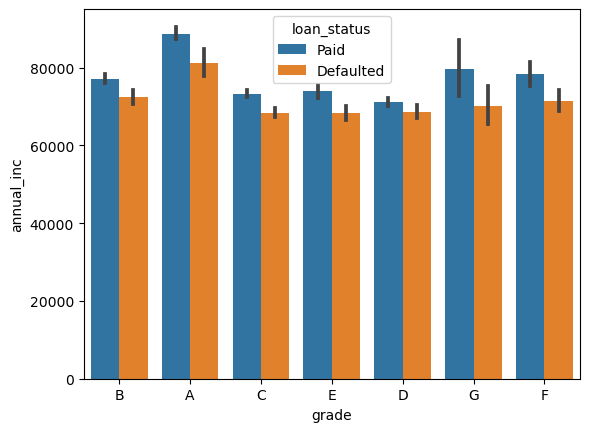

In [32]:
sns.barplot(x=df['grade'],y=df['annual_inc'],hue=df['loan_status'])

<Axes: xlabel='sub_grade', ylabel='annual_inc'>

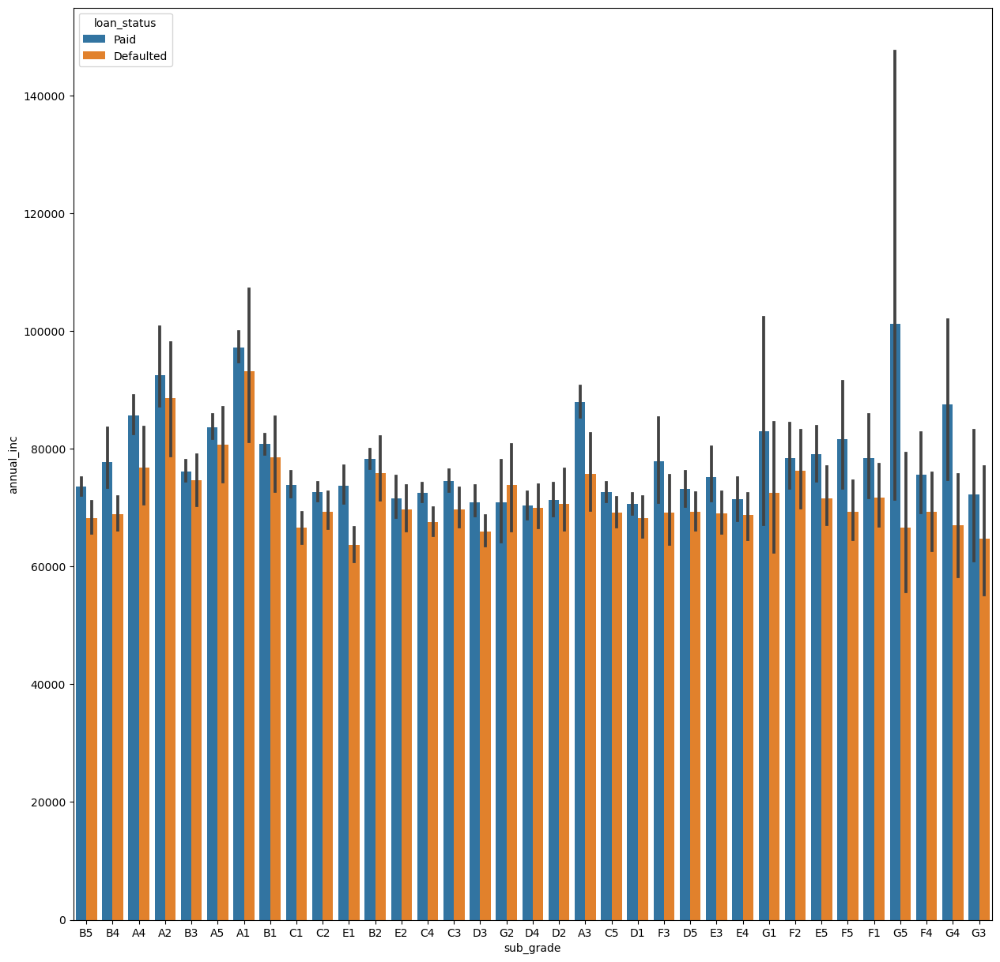

In [33]:
plt.figure(figsize=(15,15))
sns.barplot(x=df['sub_grade'],y=df['annual_inc'],hue=df['loan_status'])

<Axes: xlabel='open_acc', ylabel='total_acc'>

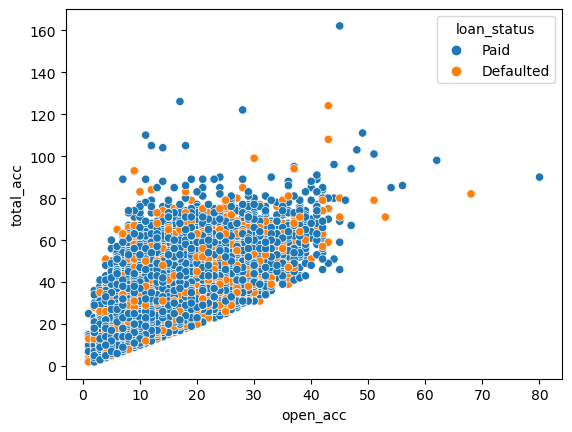

In [34]:
sns.scatterplot(x=df['open_acc'],y=df['total_acc'],hue=df['loan_status'])

C:\Users\nithi\AppData\Local\Temp\ipykernel_16648\985674555.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=df['int_rate'],y=df['annual_inc'],  color='blue',shade=True)


<Axes: xlabel='int_rate', ylabel='annual_inc'>

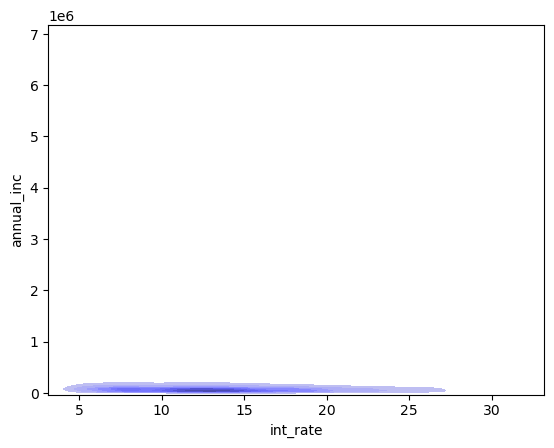

In [35]:
sns.kdeplot(x=df['int_rate'],y=df['annual_inc'],  color='blue',shade=True) 


In [36]:
pd.crosstab(df['verification_status'], df['loan_status'])



loan_status,Defaulted,Paid
verification_status,,
Not Verified,3492,20524
Source Verified,6384,24025
Verified,5776,18746


In [ ]:
#People who's verification_status is not verified defaulted the least.
#People who's verification_status is Source verified Paid the Most.

In [42]:
pd.crosstab(df['home_ownership'], df['loan_status'])

loan_status,Defaulted,Paid
home_ownership,,
ANY,2,17
MORTGAGE,6659,32496
NONE,0,4
OTHER,4,2
OWN,1743,6794
RENT,7244,23982


In [ ]:
# people with mortgages paid off their the highest compared to ones who own or rent their houses. This talks more about human psychology than a business related insight. people who have their house mortgaged might be afraid of losing their houses if loans are not paid so they default very rarely. while people who rent don't have anything tied to their loans causing them to default the most. People who own houses also have something to lose.

In [68]:
emp_length_loan=pd.crosstab(df['emp_length'], df['loan_status'])

In [70]:
emp_length_loan

loan_status,Defaulted,Paid
emp_length,,
1 year,1032,4172
10+ years,4850,21090
2 years,1441,5783
3 years,1242,5154
4 years,935,3775
5 years,982,4054
6 years,711,2934
7 years,734,2831
8 years,705,2843


In [69]:
emp_length_loan['Defaulted']/emp_length_loan['Paid']

emp_length
1 year       0.247363
10+ years    0.229967
2 years      0.249179
3 years      0.240978
4 years      0.247682
5 years      0.242230
6 years      0.242331
7 years      0.259272
8 years      0.247977
9 years      0.250420
< 1 year     0.247705
Unknown      0.361884
dtype: float64

In [ ]:
#Defaulted rate doesnt change much with emp_length

In [73]:
verif_loan=pd.crosstab(df['verification_status'], df['loan_status'])

In [74]:
verif_loan

loan_status,Defaulted,Paid
verification_status,,
Not Verified,3492,20524
Source Verified,6384,24025
Verified,5776,18746


In [75]:
verif_loan['Defaulted']/verif_loan['Paid']

verification_status
Not Verified       0.170142
Source Verified    0.265723
Verified           0.308119
dtype: float64

In [44]:
pd.crosstab(df['term'], df['loan_status'])

loan_status,Defaulted,Paid
term,,
36 months,9587,50357
60 months,6065,12938


In [ ]:
#people with a lower interest term paid more based on the percentage deafualted calculated above

<Axes: xlabel='loan_status', ylabel='Interest_income'>

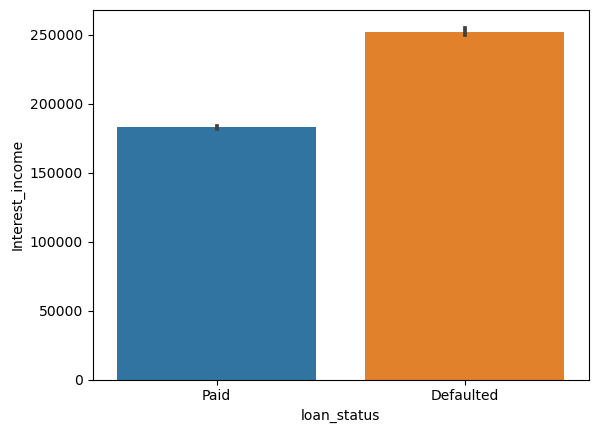

In [114]:
sns.barplot(y=df['Interest_income'],x=df['loan_status'])

In [ ]:
#more the interest income more the number of people who defaulted

In [110]:
Interest_income_l=pd.crosstab(df['Interest_income'], df['loan_status'])

In [111]:
Interest_income_l

loan_status,Defaulted,Paid
Interest_income,,
5310.00,0,1
5320.00,0,3
6030.00,0,1
6080.00,0,1
6240.00,0,1
6540.00,0,1
6680.00,0,1
6720.00,0,1
6890.00,0,1


In [113]:
used_loan_amt_loan['Defaulted']/used_loan_amt_loan['Paid']

used_loan_amt
0.000         0.236364
0.002         0.000000
0.003         0.000000
0.004         0.000000
0.005         0.000000
0.006         1.000000
0.007         0.000000
0.008         0.000000
0.009         2.000000
0.010         0.000000
0.011         0.000000
0.012         0.000000
0.013         0.000000
0.014              inf
0.017         0.000000
0.018         0.000000
0.019         0.000000
0.024         1.000000
0.025         0.000000
0.026         0.000000
0.027         0.000000
0.028         0.000000
0.029         0.000000
0.030         0.000000
0.031         0.000000
0.032         0.000000
0.037         0.000000
0.038         0.333333
0.039         0.000000
0.040         0.000000
0.042         0.000000
0.046         0.000000
0.048         0.000000
0.050         0.000000
0.051         0.000000
0.052              inf
0.055         0.000000
0.056         0.000000
0.057         0.000000
0.060         0.000000
0.062         0.000000
0.066         1.000000
0.072              i

In [48]:
# with each grade we can see the defualted rate increases meaning the risk of the bank increases. 

0.1547043881057927

<Axes: xlabel='grade', ylabel='loan_amnt'>

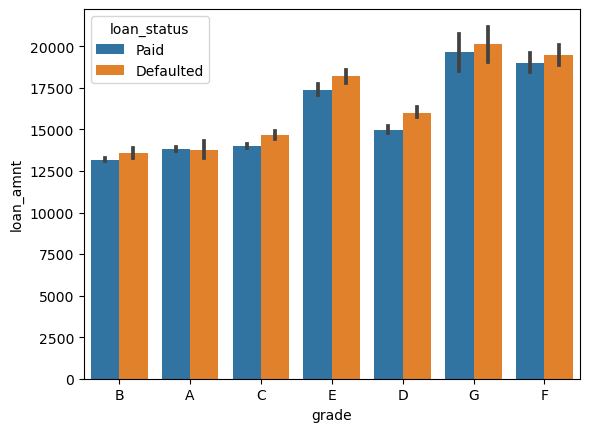

In [64]:
sns.barplot(x=df['grade'],y=df['loan_amnt'],hue=df['loan_status'])

In [106]:
num_cols

['annual_inc',
 'int_rate',
 'loan_amnt',
 'num_actv_bc_tl',
 'mort_acc',
 'tot_cur_bal',
 'open_acc',
 'pub_rec',
 'pub_rec_bankruptcies',
 'revol_bal',
 'revol_util',
 'total_acc',
 'fico_avg',
 'Interest_income',
 'used_loan_amt']

# Outlier Detection


Skew : 41.56


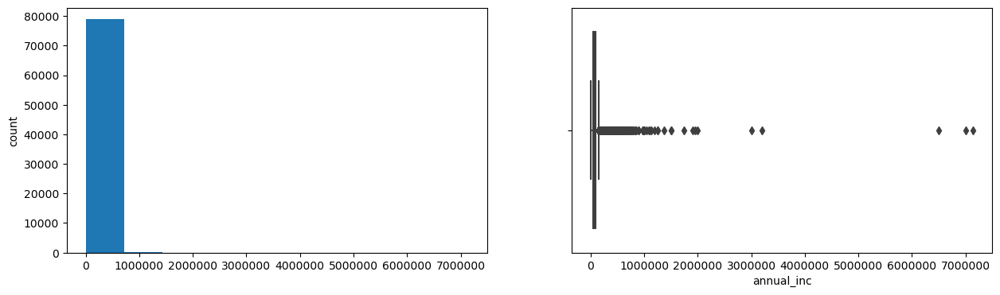

Skew : 0.71


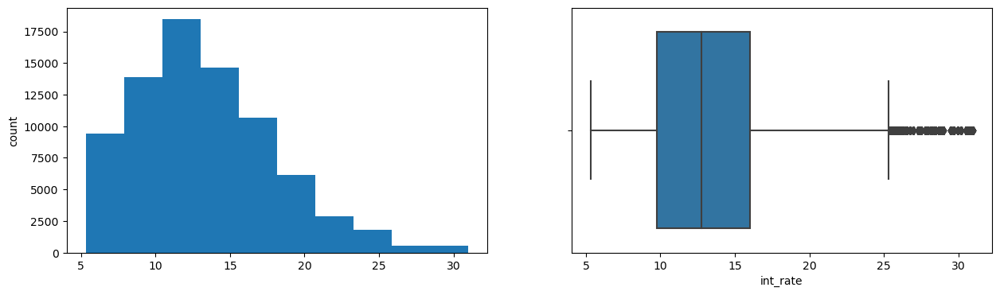

Skew : 0.79


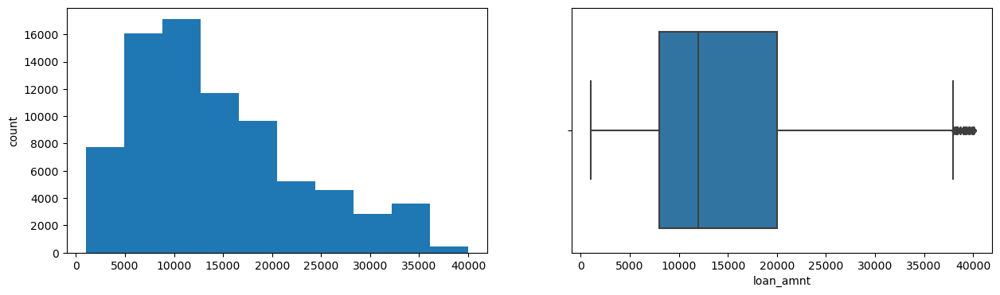

Skew : 1.49


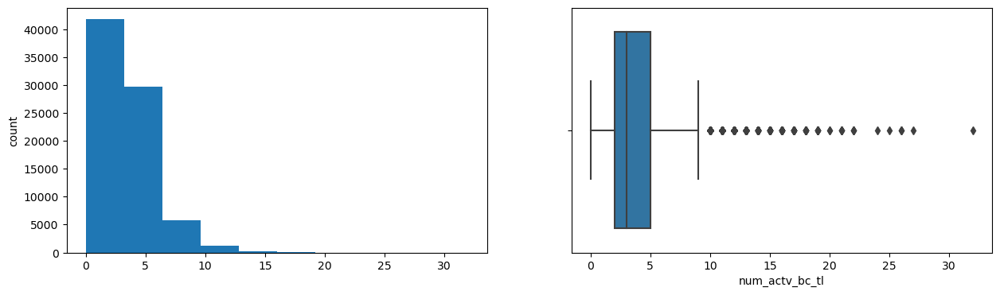

Skew : 1.72


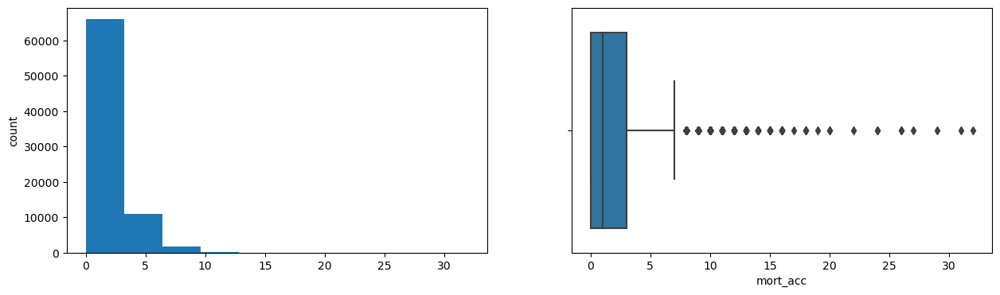

Skew : 3.27


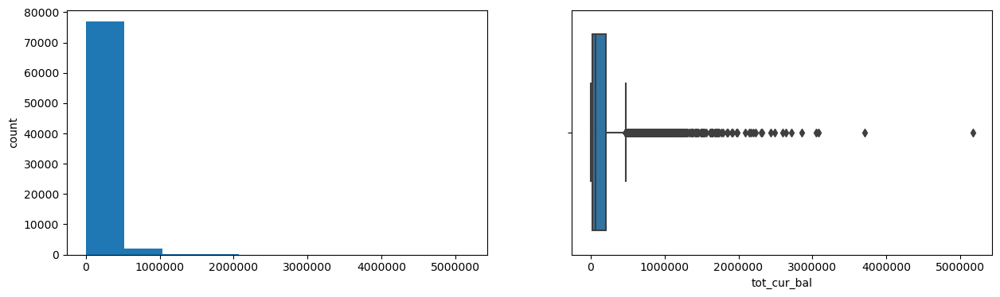

Skew : 1.27


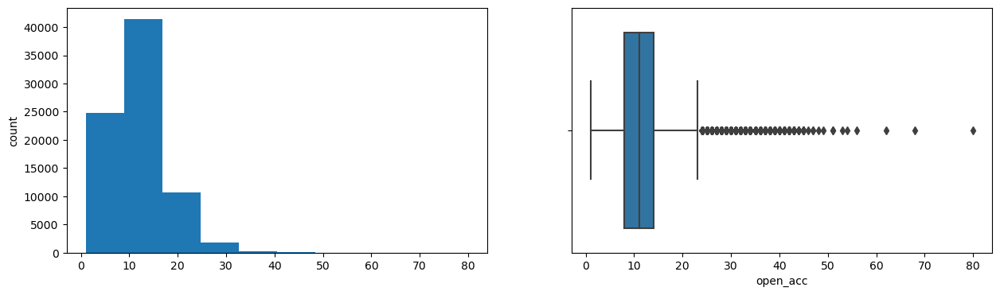

Skew : 5.38


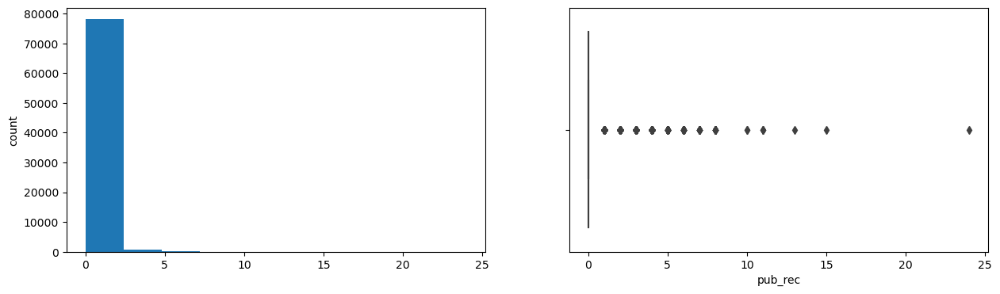

Skew : 3.34


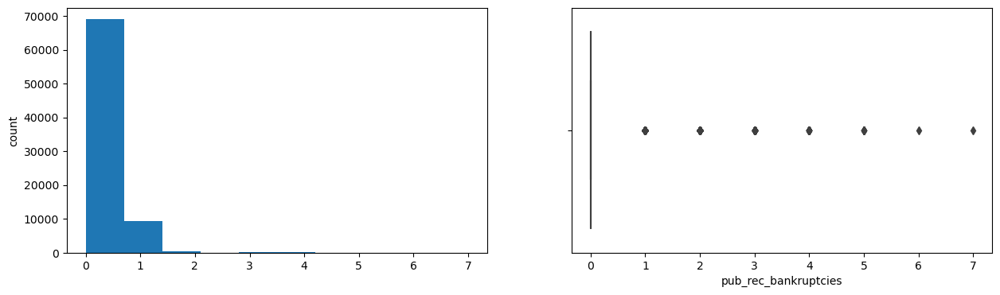

Skew : 9.95


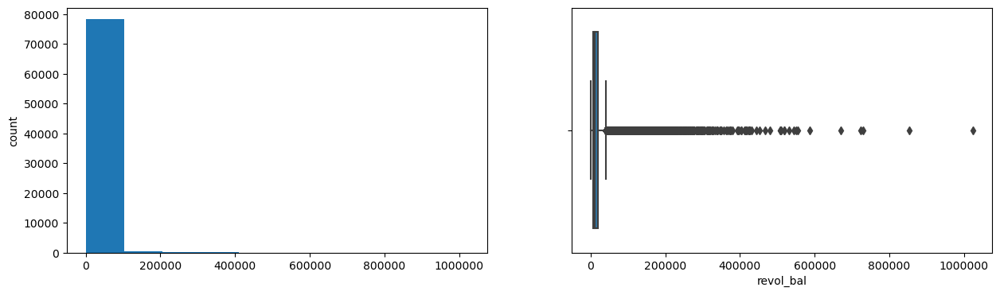

Skew : -0.07


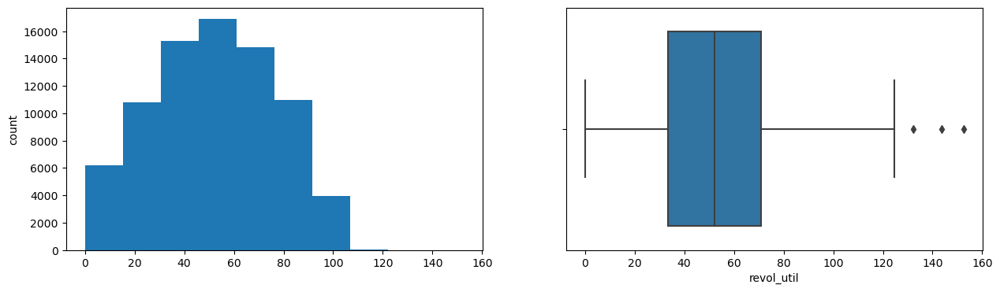

Skew : 0.96


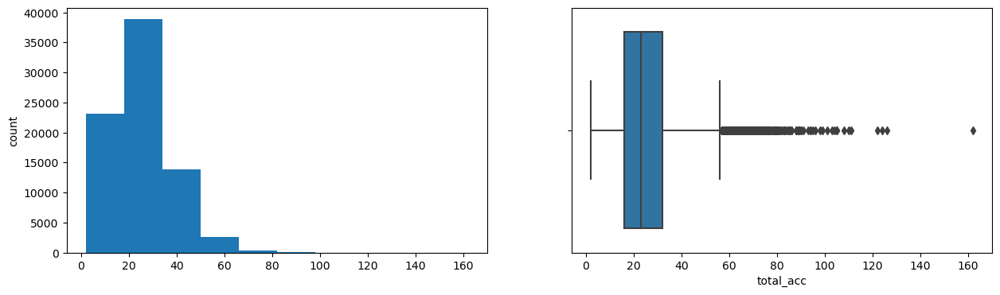

Skew : 1.29


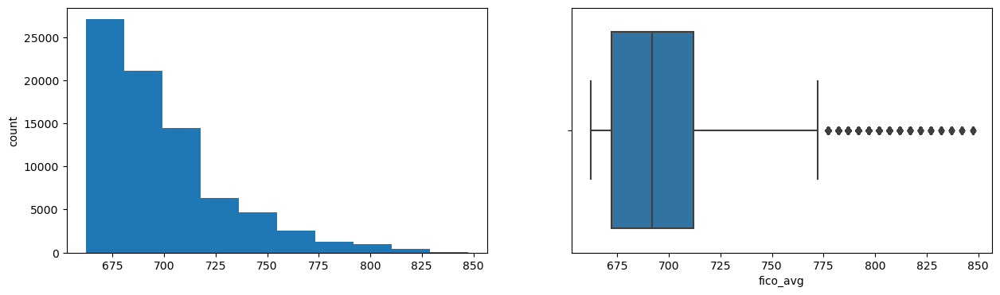

Skew : 1.64


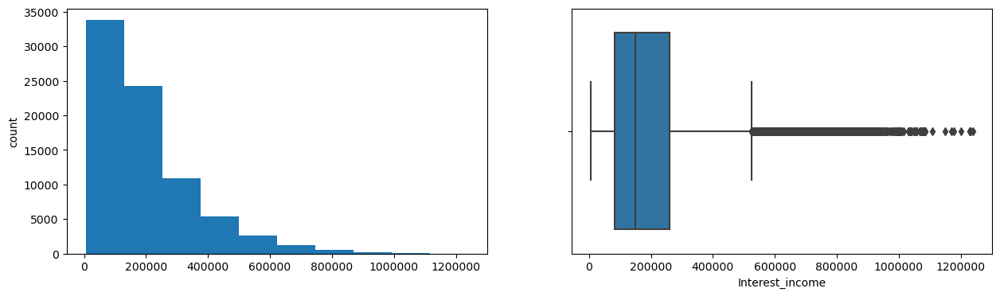

Skew : 12.57


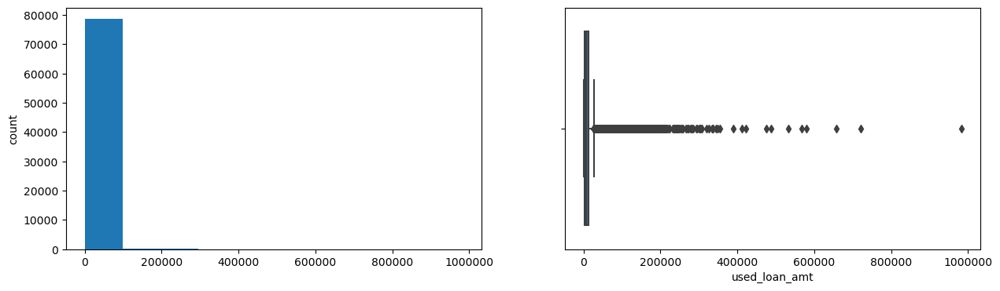

In [116]:

for col in num_cols:
    print('Skew :', round(df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.ticklabel_format(style="plain")
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.ticklabel_format(style='plain', axis='x')
    plt.show()
    
    

In [117]:
import numpy as np
outliers = []
def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    # print(mean, std)
    for i in data:
       
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return (outliers)# Driver code
for x in num_cols:
    
    sample_outliers = detect_outliers_zscore(df[x])
    print("Outliers from Z-scores method: ", sample_outliers)
    
  


Outliers from Z-scores method:  [450000.0, 980000.0, 609000.0, 300000.0, 780000.0, 408000.0, 330000.0, 336000.0, 520000.0, 310000.0, 290000.0, 350000.0, 325000.0, 400000.0, 420000.0, 1000000.0, 320000.0, 330000.0, 600000.0, 300000.0, 310000.0, 350000.0, 450000.0, 300000.0, 300000.0, 401000.0, 425000.0, 360000.0, 341000.0, 1900000.0, 700000.0, 330000.0, 325000.0, 700000.0, 381000.0, 300000.0, 300000.0, 450000.0, 360000.0, 343000.0, 300000.0, 300000.0, 389000.0, 500000.0, 330000.0, 550000.0, 510000.0, 305000.0, 650000.0, 350000.0, 460000.0, 324000.0, 750000.0, 300000.0, 550000.0, 305000.0, 465154.0, 390000.0, 300000.0, 900000.0, 550000.0, 290000.0, 340000.0, 390000.0, 3000000.0, 300000.0, 450000.0, 500000.0, 285000.0, 400000.0, 450000.0, 300000.0, 400000.0, 300000.0, 445000.0, 400000.0, 312000.0, 350000.0, 290000.0, 300000.0, 310000.0, 405000.0, 325000.0, 300000.0, 350000.0, 300000.0, 350000.0, 305000.0, 360000.0, 450000.0, 290000.0, 300000.0, 290700.0, 750000.0, 300000.0, 720000.0, 2900

Outliers from Z-scores method:  [450000.0, 980000.0, 609000.0, 300000.0, 780000.0, 408000.0, 330000.0, 336000.0, 520000.0, 310000.0, 290000.0, 350000.0, 325000.0, 400000.0, 420000.0, 1000000.0, 320000.0, 330000.0, 600000.0, 300000.0, 310000.0, 350000.0, 450000.0, 300000.0, 300000.0, 401000.0, 425000.0, 360000.0, 341000.0, 1900000.0, 700000.0, 330000.0, 325000.0, 700000.0, 381000.0, 300000.0, 300000.0, 450000.0, 360000.0, 343000.0, 300000.0, 300000.0, 389000.0, 500000.0, 330000.0, 550000.0, 510000.0, 305000.0, 650000.0, 350000.0, 460000.0, 324000.0, 750000.0, 300000.0, 550000.0, 305000.0, 465154.0, 390000.0, 300000.0, 900000.0, 550000.0, 290000.0, 340000.0, 390000.0, 3000000.0, 300000.0, 450000.0, 500000.0, 285000.0, 400000.0, 450000.0, 300000.0, 400000.0, 300000.0, 445000.0, 400000.0, 312000.0, 350000.0, 290000.0, 300000.0, 310000.0, 405000.0, 325000.0, 300000.0, 350000.0, 300000.0, 350000.0, 305000.0, 360000.0, 450000.0, 290000.0, 300000.0, 290700.0, 750000.0, 300000.0, 720000.0, 2900

Outliers from Z-scores method:  [450000.0, 980000.0, 609000.0, 300000.0, 780000.0, 408000.0, 330000.0, 336000.0, 520000.0, 310000.0, 290000.0, 350000.0, 325000.0, 400000.0, 420000.0, 1000000.0, 320000.0, 330000.0, 600000.0, 300000.0, 310000.0, 350000.0, 450000.0, 300000.0, 300000.0, 401000.0, 425000.0, 360000.0, 341000.0, 1900000.0, 700000.0, 330000.0, 325000.0, 700000.0, 381000.0, 300000.0, 300000.0, 450000.0, 360000.0, 343000.0, 300000.0, 300000.0, 389000.0, 500000.0, 330000.0, 550000.0, 510000.0, 305000.0, 650000.0, 350000.0, 460000.0, 324000.0, 750000.0, 300000.0, 550000.0, 305000.0, 465154.0, 390000.0, 300000.0, 900000.0, 550000.0, 290000.0, 340000.0, 390000.0, 3000000.0, 300000.0, 450000.0, 500000.0, 285000.0, 400000.0, 450000.0, 300000.0, 400000.0, 300000.0, 445000.0, 400000.0, 312000.0, 350000.0, 290000.0, 300000.0, 310000.0, 405000.0, 325000.0, 300000.0, 350000.0, 300000.0, 350000.0, 305000.0, 360000.0, 450000.0, 290000.0, 300000.0, 290700.0, 750000.0, 300000.0, 720000.0, 2900

Outliers from Z-scores method:  [450000.0, 980000.0, 609000.0, 300000.0, 780000.0, 408000.0, 330000.0, 336000.0, 520000.0, 310000.0, 290000.0, 350000.0, 325000.0, 400000.0, 420000.0, 1000000.0, 320000.0, 330000.0, 600000.0, 300000.0, 310000.0, 350000.0, 450000.0, 300000.0, 300000.0, 401000.0, 425000.0, 360000.0, 341000.0, 1900000.0, 700000.0, 330000.0, 325000.0, 700000.0, 381000.0, 300000.0, 300000.0, 450000.0, 360000.0, 343000.0, 300000.0, 300000.0, 389000.0, 500000.0, 330000.0, 550000.0, 510000.0, 305000.0, 650000.0, 350000.0, 460000.0, 324000.0, 750000.0, 300000.0, 550000.0, 305000.0, 465154.0, 390000.0, 300000.0, 900000.0, 550000.0, 290000.0, 340000.0, 390000.0, 3000000.0, 300000.0, 450000.0, 500000.0, 285000.0, 400000.0, 450000.0, 300000.0, 400000.0, 300000.0, 445000.0, 400000.0, 312000.0, 350000.0, 290000.0, 300000.0, 310000.0, 405000.0, 325000.0, 300000.0, 350000.0, 300000.0, 350000.0, 305000.0, 360000.0, 450000.0, 290000.0, 300000.0, 290700.0, 750000.0, 300000.0, 720000.0, 2900

Outliers from Z-scores method:  [450000.0, 980000.0, 609000.0, 300000.0, 780000.0, 408000.0, 330000.0, 336000.0, 520000.0, 310000.0, 290000.0, 350000.0, 325000.0, 400000.0, 420000.0, 1000000.0, 320000.0, 330000.0, 600000.0, 300000.0, 310000.0, 350000.0, 450000.0, 300000.0, 300000.0, 401000.0, 425000.0, 360000.0, 341000.0, 1900000.0, 700000.0, 330000.0, 325000.0, 700000.0, 381000.0, 300000.0, 300000.0, 450000.0, 360000.0, 343000.0, 300000.0, 300000.0, 389000.0, 500000.0, 330000.0, 550000.0, 510000.0, 305000.0, 650000.0, 350000.0, 460000.0, 324000.0, 750000.0, 300000.0, 550000.0, 305000.0, 465154.0, 390000.0, 300000.0, 900000.0, 550000.0, 290000.0, 340000.0, 390000.0, 3000000.0, 300000.0, 450000.0, 500000.0, 285000.0, 400000.0, 450000.0, 300000.0, 400000.0, 300000.0, 445000.0, 400000.0, 312000.0, 350000.0, 290000.0, 300000.0, 310000.0, 405000.0, 325000.0, 300000.0, 350000.0, 300000.0, 350000.0, 305000.0, 360000.0, 450000.0, 290000.0, 300000.0, 290700.0, 750000.0, 300000.0, 720000.0, 2900

{'whiskers': [<matplotlib.lines.Line2D at 0x1fc0574e190>,
 'caps': [<matplotlib.lines.Line2D at 0x1fc0574f990>,
 'boxes': [<matplotlib.lines.Line2D at 0x1fc05732190>],
 'medians': [<matplotlib.lines.Line2D at 0x1fc05755010>],
 'fliers': [<matplotlib.lines.Line2D at 0x1fc05755a50>],
 'means': []}

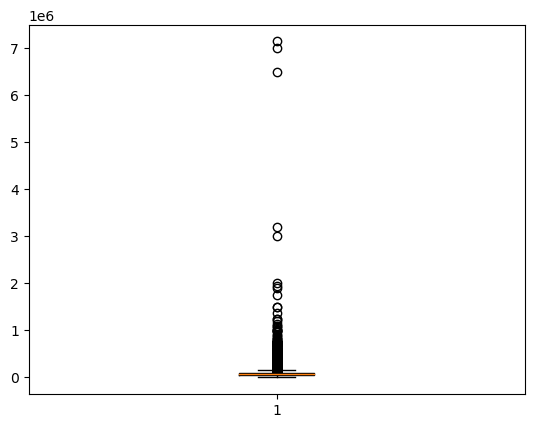

In [118]:
plt.boxplot(df['annual_inc'])

In [121]:
df.corr(numeric_only=True)['loan_status']

annual_inc              0.042968
int_rate               -0.255499
loan_amnt              -0.064607
num_actv_bc_tl         -0.036859
mort_acc                0.073366
tot_cur_bal             0.065391
open_acc               -0.030396
pub_rec                -0.028541
pub_rec_bankruptcies   -0.026033
revol_bal               0.023046
revol_util             -0.054176
total_acc               0.010337
loan_status             1.000000
fico_avg                0.127778
Interest_income        -0.176226
used_loan_amt           0.007899
Name: loan_status, dtype: float64

In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 78947 entries, 0 to 79999
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   addr_state            78947 non-null  object 
 1   annual_inc            78947 non-null  float64
 2   earliest_cr_line      78947 non-null  object 
 3   emp_length            78947 non-null  object 
 4   emp_title             78947 non-null  object 
 5   grade                 78947 non-null  object 
 6   home_ownership        78947 non-null  object 
 7   application_type      78947 non-null  object 
 8   initial_list_status   78947 non-null  object 
 9   int_rate              78947 non-null  float64
 10  loan_amnt             78947 non-null  int64  
 11  num_actv_bc_tl        78947 non-null  float64
 12  mort_acc              78947 non-null  float64
 13  tot_cur_bal           78947 non-null  float64
 14  open_acc              78947 non-null  int64  
 15  pub_rec               78

In [159]:
encoder=LabelEncoder()
df['loan_status'] = encoder.fit_transform(df['loan_status'])

In [ ]:
df.info()

In [ ]:
df.corr(numeric_only=True)['loan_status']

In [40]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
df.info()

In [160]:
df['fico_avg']=(df['fico_range_high']+df['fico_range_low'])/2
df.drop(columns=['fico_range_low','fico_range_high'],inplace=True)

In [161]:
#used_loan_amt
df['used_loan_amt']=(df['revol_util']/100)*df['revol_bal']

In [ ]:
df['used_loan_amt']

In [162]:
#Debt_To_Income_ratio
round((df['loan_amnt'] /df['annual_inc'])*100,2)

0             3.60
1             1.75
2            10.00
3             3.33
4            12.97
5             7.04
6             8.62
7             8.42
8             5.78
9             9.12
10            6.20
11           10.61
12           18.46
13            8.40
14           18.46
15            7.37
16           22.08
17            6.90
18            7.84
19           16.00
20           16.88
21            6.25
22           18.62
23           13.25
24           13.66
25            6.06
26           14.29
27            7.96
28           24.00
29            9.00
30           23.33
31            6.54
32           11.00
33            9.71
34           11.86
35           11.28
36           30.77
37           26.32
38           23.08
39           13.60
40           13.64
41           26.53
42           28.57
43           12.58
44           13.33
45           10.00
46           25.91
47           36.67
48           22.11
49           32.00
50            4.05
51            6.67
52          

In [163]:
df['Interest_income']=df["loan_amnt"]*df['int_rate']

In [ ]:
df[['total_acc','open_acc']]

In [ ]:
fig, axes = plt.subplots(3, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')


sns.countplot(ax = axes[0, 0], x = 'addr_state', data = df, color = 'blue', 
                  order = df['addr_state'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'earliest_cr_line', data = df, color = 'blue', 
                  order = df['earliest_cr_line'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'emp_title', data = df, color = 'blue', 
                  order = df['emp_title'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'grade', data = df, color = 'blue', 
                  order = df['grade'].value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'home_ownership', data = df, color = 'blue', 
                  order = df['home_ownership'].value_counts().index);
sns.countplot(ax = axes[2, 1], x = 'application_type', data = df, color = 'blue', 
                  order = df['application_type'].value_counts().index);
    
    
    
      
axes[1][1].tick_params(labelrotation=45);
axes[2][0].tick_params(labelrotation=90);
axes[2][1].tick_params(labelrotation=90);

In [ ]:
df.info()

# Feature Selection


In [164]:
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
# Select the specific columns



In [176]:
def prepare_inputs(X_train, X_test):
    oe = OrdinalEncoder()
    oe.fit(X)
    X_train_enc = oe.transform(X_train)
    X_test_enc = oe.transform(X_test)
    return X_train_enc, X_test_enc

def prepare_targets(y_train, y_test):
    le = LabelEncoder()
    le.fit(y)
    y_train_enc = le.transform(y_train)
    y_test_enc = le.transform(y_test)
    return y_train_enc, y_test_enc

In [177]:
cat_data = df.select_dtypes(include=['object'])
X = cat_data.iloc[:, :-1].values
y = cat_data.iloc[:,-1].values

In [178]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    random_state=1)
# prepare input data
X_train_enc, X_test_enc = prepare_inputs(X_train, X_test)
# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

In [179]:
def select_features(X_train, y_train, X_test, k_value='all'):
    fs = SelectKBest(score_func=chi2, k=k_value)
    fs.fit(X_train, y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

In [180]:
X_train_fs, X_test_fs, fs = select_features(X_train_enc,
                                            y_train_enc,X_test,5)

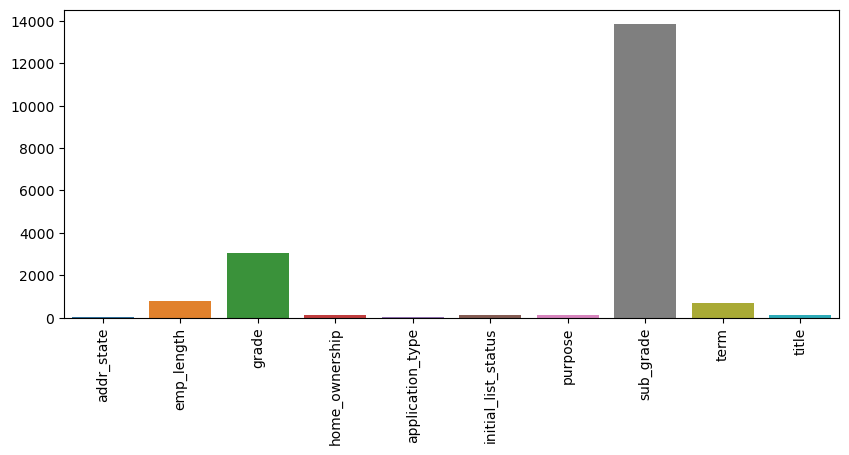

In [181]:
names = []
values = []
for i in range(len(fs.scores_)):
    names.append(cat_data.columns[i])
    values.append(fs.scores_[i])
chi_list = zip(names, values)

# plot the scores
plt.figure(figsize=(10,4))
sns.barplot(x=names, y=values)
plt.xticks(rotation = 90)
plt.show()

In [182]:
fs.get_feature_names_out()

array(['x1', 'x2', 'x5', 'x7', 'x8'], dtype=object)

In [172]:
df['emp_title'].nunique()

36316

In [ ]:
#too many categories in emp_title so i will drop this column

In [173]:
df['title'].nunique()

5320

In [ ]:
#too many categories in title not as much as emp_title so going to reduce categories for easier processing

In [175]:
df['title']=df['purpose']
# I did this because looking at the column purpose it acts as a root category to title ex. all the values in title relating to car loan, truck loan etc are all conveniently categorized in purpose

In [174]:
df.drop(columns=['emp_title'],inplace=True)

In [ ]:
#going to onehotencode the top 5 categories given in the k chi square

In [183]:
encoder=OneHotEncoder(sparse_output=False,drop="first")
encoder.fit(df[['sub_grade']])
transformed=encoder.transform(df[['sub_grade']])
ohe_df = pd.DataFrame(transformed, columns=encoder.get_feature_names_out())
#concat with original data
df_dem=pd.concat([df.reset_index(drop=True),ohe_df.reset_index(drop=True)], axis=1).drop(['sub_grade'],axis=1)


In [184]:

encoder=OneHotEncoder(sparse_output=False,drop="first")
encoder.fit(df_dem[['grade']])
transformed=encoder.transform(df_dem[['grade']])
ohe_df = pd.DataFrame(transformed, columns=encoder.get_feature_names_out())

df_dem=pd.concat([df_dem.reset_index(drop=True),ohe_df.reset_index(drop=True)], axis=1).drop(['grade'],axis=1)



In [186]:


encoder=OneHotEncoder(sparse_output=False,drop="first")
encoder.fit(df_dem[['emp_length']])
transformed=encoder.transform(df_dem[['emp_length']])
print(transformed)
ohe_df = pd.DataFrame(transformed, columns=encoder.get_feature_names_out())

df_dem=pd.concat([df_dem.reset_index(drop=True),ohe_df.reset_index(drop=True)], axis=1).drop(['emp_length'],axis=1)
#

[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [187]:


encoder=OneHotEncoder(sparse_output=False,drop="first")
encoder.fit(df_dem[['term']])
transformed=encoder.transform(df_dem[['term']])
print(transformed)
ohe_df = pd.DataFrame(transformed, columns=encoder.get_feature_names_out())

df_dem=pd.concat([df_dem.reset_index(drop=True),ohe_df.reset_index(drop=True)], axis=1).drop(['term'],axis=1)
#

[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]


In [188]:
encoder=LabelEncoder()
df_dem['loan_status'] = encoder.fit_transform(df['loan_status'])

In [ ]:
df_dem['Interest_income']=df_dem["loan_amnt"]*df_dem['int_rate']


In [196]:
df_dem.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78947 entries, 0 to 78946
Data columns (total 69 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   annual_inc            78947 non-null  float64
 1   home_ownership        78947 non-null  object 
 2   int_rate              78947 non-null  float64
 3   loan_amnt             78947 non-null  int64  
 4   num_actv_bc_tl        78947 non-null  float64
 5   mort_acc              78947 non-null  float64
 6   tot_cur_bal           78947 non-null  float64
 7   open_acc              78947 non-null  int64  
 8   pub_rec               78947 non-null  int64  
 9   pub_rec_bankruptcies  78947 non-null  float64
 10  revol_bal             78947 non-null  int64  
 11  revol_util            78947 non-null  float64
 12  total_acc             78947 non-null  int64  
 13  loan_status           78947 non-null  int64  
 14  fico_avg              78947 non-null  float64
 15  used_loan_amt      

In [192]:
#drop the unnecesary columns
df_dem.drop(columns=['addr_state','application_type','verification_status','initial_list_status','purpose'],inplace=True)


In [197]:
df_dem.drop(columns=['home_ownership'],inplace=True)
# df_dem.drop(columns=['title'],inplace=True)

In [ ]:
df_dem['fico_avg']=(df_dem['fico_range_high']+df_dem['fico_range_low'])/2

In [ ]:
df_dem.drop(columns=['fico_range_high','fico_range_low'],inplace=True)

In [198]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(sampling_strategy='minority', random_state=42)
X, y = sm.fit_resample(df_dem.drop('loan_status', axis=1), df_dem['loan_status'])
oversampled = pd.concat([pd.DataFrame(y), pd.DataFrame(X)], axis=1)

In [ ]:
oversampled['loan_status'].value_counts()

In [199]:
from sklearn import preprocessing
# create a MinMaxScaler object
scaler = preprocessing.MinMaxScaler()

# fit and transform the data
normalized_data = scaler.fit_transform(oversampled)
scaled_df = pd.DataFrame(oversampled, columns=df_dem.columns)


In [200]:
X=scaled_df.drop(columns=['loan_status'])

In [201]:
y=scaled_df['loan_status']

In [202]:
X_train_temp, X_test, y_train_temp, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.35,
                                                    random_state=40)

X_train, X_val, y_train, y_val = train_test_split(X_train_temp, y_train_temp, test_size=0.35, random_state=43) 
# prepare input data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)



In [203]:
rf = RandomForestClassifier(max_features= 7, min_samples_leaf= 1, min_samples_split= 2, n_estimators= 200)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_val)


In [204]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
import math

mse = math.sqrt(mean_squared_error(y_val, y_pred))
print("RMSE:",mse)

RMSE: 0.356341362553755


In [205]:
mae = mean_absolute_error(y_pred, y_val)
print("The MAE of the random forest model is:", mae)

The MAE of the random forest model is: 0.12697916666666667


In [206]:
from sklearn.metrics import f1_score,confusion_matrix,recall_score,precision_score,accuracy_score

f1_score(y_val, y_pred,pos_label=1)

0.8835980520100583

In [207]:
confusion_matrix(y_val, y_pred)

array([[11263,  3222],
       [  435, 13880]], dtype=int64)

In [208]:
recall_average = recall_score(y_val, y_pred, average="binary",pos_label=1.0)
recall_average

0.9696122947956689

In [209]:

precision_score(y_val, y_pred,pos_label=1)

0.8116009823412467

In [210]:
score =accuracy_score(y_val,y_pred)
score

0.8730208333333334

In [211]:
y_pred = rf.predict(X_test)

In [212]:
confusion_matrix(y_test, y_pred)

array([[17345,  5003],
       [  595, 21364]], dtype=int64)

In [213]:
recall_average = recall_score(y_test, y_pred, average="binary",pos_label=1.0)
recall_average

0.9729040484539369

In [214]:

precision_score(y_test, y_pred,pos_label=1)

0.810255243296545

In [215]:
score =accuracy_score(y_test,y_pred)
score

0.8736542758480601

In [216]:
f1_score(y_test, y_pred,pos_label=1)

0.8841617348839134

In [220]:
grid_space={'max_depth':[3,5,10,None],
              'n_estimators':[10,100,200],
              'max_features':[1,3,5,7],
              'min_samples_leaf':[1,2,3],
              'min_samples_split':[1,2,3]
           }

In [221]:
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(rf,param_grid=grid_space,cv=3,scoring='accuracy')
model_grid = grid.fit(X,y)

KeyboardInterrupt: 

In [ ]:
print('Best hyperparameters are: '+str(model_grid.best_params_))
print('Best score is: '+str(model_grid.best_score_))

In [217]:
   
from sklearn.model_selection import cross_val_score, KFold
from sklearn.svm import SVC
from sklearn.datasets import load_iris

In [218]:
model=RandomForestClassifier(max_features= 7, min_samples_leaf= 1, min_samples_split= 2, n_estimators= 200)
k_folds = KFold(n_splits = 5)

scores = cross_val_score(model, X, y, cv = k_folds)

In [219]:
print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.82743503 0.79263765 0.79686389 0.96899439 0.99656371]
Average CV Score:  0.8764989335650526
Number of CV Scores used in Average:  5


In [ ]:
model = pickle.load(open('model.pkl', 'rb'))

# Export the model
pickle.dump(model, open('model_exported.pkl', 'wb'))